# 09: Demonstration of MODFLOW 6 Groundwater Transport with a Voronoi Grid

MODFLOW 6 includes a Groundwater Transport (GWT) Model for simulation of solute transport through the subsurface.  The GWT Model can be used with structured or unstructured model grids.  The purpose of this example is to demonstrate the construction, running, and post-processing of a simple solute transport model.

The solute transport model is based on an existing flow model of the Freyberg example.  The flow model uses a voronoi model grid to simulate steady-state conditions.  In this notebook, we create a transient solute transport model using the same voronoi grid.

The following steps are taken in this notebook:
* Load the existing flow model into FloPy
* Plot the model grid
* Create the solute transport model
* Run the solute transport model with MODFLOW 6
* Create animations of the model results

### Imports

In [1]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

import flopy
from flopy.utils.triangle import Triangle as Triangle

### Load and Plot the Existing Flow Model

In [2]:
model_ws_load = "./data/voronoi/"
model_ws = "./temp/voronoi-gwt/"
name = "voronoi"
name_load = "project"

Load a few shapefiles with geopandas

In [3]:
river_shp = "data_project/Flowline_river.shp"
wells_shp = "data_project/pumping_well_locations.shp"

Load the existing voronoi groundwater flow model

In [4]:
%%capture
sim = flopy.mf6.MFSimulation.load(sim_ws=model_ws_load, sim_name=name)

Get the gwf model

In [5]:
gwf = sim.get_model()

We will assign a constant concentration condition to the x, y location of 550, 7900.  Use the `modelgrid.intersect` method to determine the cell number for the constant concentration condition.

In [6]:
x, y = 550, 7900

In [7]:
cc_cell = gwf.modelgrid.intersect(x, y)
cc_cell

2027

Plot the grid

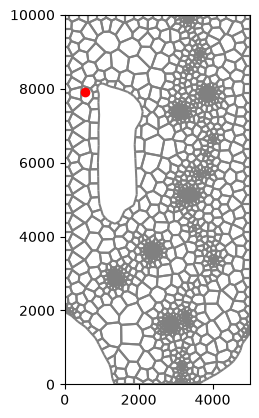

In [8]:
gwf.modelgrid.plot()
ax = plt.gca()
ax.plot(x, y, marker="o", lw=0, color="red", )

### Create the Groundwater Transport Model

Get data from the GWF DISV package

In [9]:
nlay, ncpl = gwf.disv.nlay.array, gwf.disv.ncpl.array
nlay, ncpl

(3, 2240)

In [10]:
top, botm = gwf.disv.top.array, gwf.disv.botm.array
top.shape, botm.shape

((2240,), (3, 2240))

In [11]:
nverts = gwf.disv.nvert.array
nverts

4908

In [12]:
vertices, cell2d = gwf.disv.vertices.array, gwf.disv.cell2d.array

Create the GWT model

In [13]:
sim_gwt = flopy.mf6.MFSimulation(sim_name=name, sim_ws=model_ws)
tdis = flopy.mf6.ModflowTdis(sim_gwt, 
                             time_units="days",
                             perioddata=((10000.0, 100, 1.0),),
                            )
ims = flopy.mf6.ModflowIms(
    sim_gwt,
    linear_acceleration="bicgstab",
    outer_maximum=200,
    inner_maximum=100,
    print_option="all",
)

In [14]:
gwt = flopy.mf6.ModflowGwt(sim_gwt, modelname=name)

Create the GWT packages

In [15]:
dis = flopy.mf6.ModflowGwtdisv(
    gwt,
    length_units="feet",
    nlay=nlay,
    ncpl=ncpl,
    nvert=nverts,
    top=top,
    botm=botm,
    vertices=vertices,
    cell2d=cell2d,
)
ic = flopy.mf6.ModflowGwtic(gwt, strt=0.0)
# use the TVD advection solver scheme, upstream is default
adv = flopy.mf6.ModflowGwtadv(gwt, scheme="tvd")
# define logitudinal and transverse dispersivity
dsp = flopy.mf6.ModflowGwtdsp(gwt, alh=50.0, ath1=5)
# define a uniform porosity in the "mobile" portion of the aquifer
mst = flopy.mf6.ModflowGwtmst(gwt, porosity=0.2)
# point the transport model to the flow model head and budget outputs
# these must include outputs from ALL time steps
pd = [
    ("GWFHEAD", f"../../{model_ws_load}{name_load}.hds", None),
    ("GWFBUDGET", f"../../{model_ws_load}{name_load}.cbc", None),
]
fmi = flopy.mf6.ModflowGwtfmi(gwt, packagedata=pd)
ssm = flopy.mf6.ModflowGwtssm(gwt)
# this is where we define the constanc concentration
cnc = flopy.mf6.ModflowGwtcnc(gwt, stress_period_data=[(0, cc_cell, 100.)])

oc = flopy.mf6.ModflowGwtoc(
    gwt,
    concentration_filerecord=f"{name}.ucn",
    saverecord=[("CONCENTRATION", "ALL"),],
    printrecord=[("BUDGET", "ALL")],
)
# write the model datasets
sim_gwt.write_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model voronoi...
    writing model name file...
    writing package disv...
    writing package ic...
    writing package adv...
    writing package dsp...
    writing package mst...
    writing package fmi...
    writing package ssm...
    writing package cnc_0...
INFORMATION: maxbound in ('gwt6', 'cnc', 'dimensions') changed to 1 based on size of stress_period_data
    writing package oc...


### Run the Solute Transport Model

In [16]:
sim_gwt.run_simulation()

FloPy is using the following executable to run the model: ../../../../../../../../../.local/bin/mf6
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.7.0 02/05/2026

   MODFLOW 6 compiled Feb 05 2026 22:38:38 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.6.0
                             Build 20220226_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. No warranty, expressed or 
implied, is made by the USGS or the U.S. Government as to the 
functionality of the software and related material nor shall the 
fact of release constitute any such warranty. Furthermore, the 
software is released on condition that neither the USGS nor th

    Solving:  Stress period:     1    Time step:     1


    Solving:  Stress period:     1    Time step:     2


    Solving:  Stress period:     1    Time step:     3
    Solving:  Stress period:     1    Time step:     4


    Solving:  Stress period:     1    Time step:     5


    Solving:  Stress period:     1    Time step:     6
    Solving:  Stress period:     1    Time step:     7


    Solving:  Stress period:     1    Time step:     8


    Solving:  Stress period:     1    Time step:     9
    Solving:  Stress period:     1    Time step:    10


    Solving:  Stress period:     1    Time step:    11


    Solving:  Stress period:     1    Time step:    12
    Solving:  Stress period:     1    Time step:    13


    Solving:  Stress period:     1    Time step:    14


    Solving:  Stress period:     1    Time step:    15
    Solving:  Stress period:     1    Time step:    16


    Solving:  Stress period:     1    Time step:    17


    Solving:  Stress period:     1    Time step:    18
    Solving:  Stress period:     1    Time step:    19


    Solving:  Stress period:     1    Time step:    20


    Solving:  Stress period:     1    Time step:    21
    Solving:  Stress period:     1    Time step:    22


    Solving:  Stress period:     1    Time step:    23


    Solving:  Stress period:     1    Time step:    24


    Solving:  Stress period:     1    Time step:    25
    Solving:  Stress period:     1    Time step:    26


    Solving:  Stress period:     1    Time step:    27


    Solving:  Stress period:     1    Time step:    28


    Solving:  Stress period:     1    Time step:    29


    Solving:  Stress period:     1    Time step:    30
    Solving:  Stress period:     1    Time step:    31


    Solving:  Stress period:     1    Time step:    32


    Solving:  Stress period:     1    Time step:    33
    Solving:  Stress period:     1    Time step:    34


    Solving:  Stress period:     1    Time step:    35


    Solving:  Stress period:     1    Time step:    36
    Solving:  Stress period:     1    Time step:    37


    Solving:  Stress period:     1    Time step:    38


    Solving:  Stress period:     1    Time step:    39


    Solving:  Stress period:     1    Time step:    40


    Solving:  Stress period:     1    Time step:    41
    Solving:  Stress period:     1    Time step:    42


    Solving:  Stress period:     1    Time step:    43


    Solving:  Stress period:     1    Time step:    44


    Solving:  Stress period:     1    Time step:    45


    Solving:  Stress period:     1    Time step:    46


    Solving:  Stress period:     1    Time step:    47


    Solving:  Stress period:     1    Time step:    48
    Solving:  Stress period:     1    Time step:    49


    Solving:  Stress period:     1    Time step:    50
    Solving:  Stress period:     1    Time step:    51


    Solving:  Stress period:     1    Time step:    52
    Solving:  Stress period:     1    Time step:    53


    Solving:  Stress period:     1    Time step:    54
    Solving:  Stress period:     1    Time step:    55


    Solving:  Stress period:     1    Time step:    56
    Solving:  Stress period:     1    Time step:    57
    Solving:  Stress period:     1    Time step:    58


    Solving:  Stress period:     1    Time step:    59
    Solving:  Stress period:     1    Time step:    60


    Solving:  Stress period:     1    Time step:    61
    Solving:  Stress period:     1    Time step:    62


    Solving:  Stress period:     1    Time step:    63
    Solving:  Stress period:     1    Time step:    64


    Solving:  Stress period:     1    Time step:    65
    Solving:  Stress period:     1    Time step:    66


    Solving:  Stress period:     1    Time step:    67
    Solving:  Stress period:     1    Time step:    68


    Solving:  Stress period:     1    Time step:    69
    Solving:  Stress period:     1    Time step:    70


    Solving:  Stress period:     1    Time step:    71
    Solving:  Stress period:     1    Time step:    72


    Solving:  Stress period:     1    Time step:    73
    Solving:  Stress period:     1    Time step:    74


    Solving:  Stress period:     1    Time step:    75
    Solving:  Stress period:     1    Time step:    76


    Solving:  Stress period:     1    Time step:    77
    Solving:  Stress period:     1    Time step:    78


    Solving:  Stress period:     1    Time step:    79
    Solving:  Stress period:     1    Time step:    80


    Solving:  Stress period:     1    Time step:    81
    Solving:  Stress period:     1    Time step:    82


    Solving:  Stress period:     1    Time step:    83
    Solving:  Stress period:     1    Time step:    84


    Solving:  Stress period:     1    Time step:    85
    Solving:  Stress period:     1    Time step:    86


    Solving:  Stress period:     1    Time step:    87
    Solving:  Stress period:     1    Time step:    88


    Solving:  Stress period:     1    Time step:    89
    Solving:  Stress period:     1    Time step:    90
    Solving:  Stress period:     1    Time step:    91


    Solving:  Stress period:     1    Time step:    92
    Solving:  Stress period:     1    Time step:    93
    Solving:  Stress period:     1    Time step:    94


    Solving:  Stress period:     1    Time step:    95
    Solving:  Stress period:     1    Time step:    96
    Solving:  Stress period:     1    Time step:    97


    Solving:  Stress period:     1    Time step:    98
    Solving:  Stress period:     1    Time step:    99
    Solving:  Stress period:     1    Time step:   100


 
 Run end date and time (yyyy/mm/dd hh:mm:ss): 2026/06/18 15:21:07
 Elapsed run time: 10.036 Seconds
 
 Normal termination of simulation.


(True, [])

### Post-process the results

Use `gwt.output.` method to get the concentrations. Make an animation the concentrations using `flopy.plot` methods.

In [17]:
head = gwf.output.head().get_data()
spdis = gwf.output.budget().get_data(text="DATA-SPDIS")[0]
qx, qy, qz = flopy.utils.postprocessing.get_specific_discharge(
    spdis, gwf, head=gwf.output.head().get_data(),
)

In [18]:
times = gwt.output.concentration().get_times()

In [19]:
warnings.filterwarnings("ignore")

fig, ax = plt.subplots(figsize=(4, 6), constrained_layout=True)
ax.set_aspect(1)
ax.set_xlabel(r'x')
ax.set_ylabel(r'y')
title = ax.set_title(f"Time = {times[0]} days")

# plot persistent items
vmin, vmax = 1e-3, 100.
norm = colors.LogNorm(vmin=vmin, vmax=vmax)

pmv = flopy.plot.PlotMapView(gwt, ax=ax)
pmv.plot_grid(lw=0.5, color="0.5")
pmv.contour_array(
    head, 
    levels=np.linspace(0, 30, 30), 
    tri_mask=True,
    linestyles="-",
    colors="blue",
    linewidths=0.5,
)
ca_dict = {
    "vmin": vmin,
    "vmax": vmax,
    "norm": norm,
    "masked_values": [0],
}
conc_alldata = gwt.output.concentration().get_alldata()
c = conc_alldata[0]
c[c < vmin] = 0.
cont = pmv.plot_array(c, **ca_dict)
clb = fig.colorbar(
    cont, 
    shrink=0.5, 
)

def animate(i):
    c = conc_alldata[i].flatten()
    c[c < vmin] = 0.
    cont.set_array(c)
    title = ax.set_title(f"Time = {times[i]} days")
    return cont

import matplotlib.animation
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=conc_alldata.shape[0])
plt.close()

from IPython.display import HTML
HTML(ani.to_jshtml())

# can use this command to write animation to file
#ani.save("voronoi-conc-animation.avi")

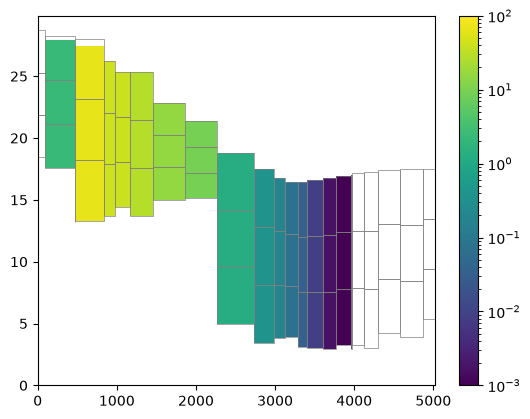

In [20]:
line = [(0, 8100), (2000, 8300), (5000, 8100)]
xs = flopy.plot.PlotCrossSection(model=gwt, line={"line": line}) 
cb = xs.plot_array(conc_alldata[-1],
                   head=gwf.output.head().get_data(),
                   norm=norm,
                   masked_values=[0], vmin=vmin, vmax=vmax)
xs.plot_grid(lw=0.5, color="0.5")
plt.colorbar(cb, ax=xs.ax)
